1. Chargement et préparation des données

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px


from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Chargement
data = pd.read_csv('export_IA.csv')
data_navigation = data[['LAT', 'LON', 'SOG', 'COG']]

# Traitement des valeurs manquantes
imputer = SimpleImputer(strategy='mean')
data_imputed = imputer.fit_transform(data_navigation)

# Normalisation
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_imputed)

# Réduction de dimension pour visualisation
pca = PCA(n_components=2)
data_pca = pca.fit_transform(data_scaled)



2. Détermination du nombre optimal de clusters

K=2, Calinski-Harabasz=18129.50
K=3, Calinski-Harabasz=28052.14
K=4, Calinski-Harabasz=26923.60
K=5, Calinski-Harabasz=22365.97


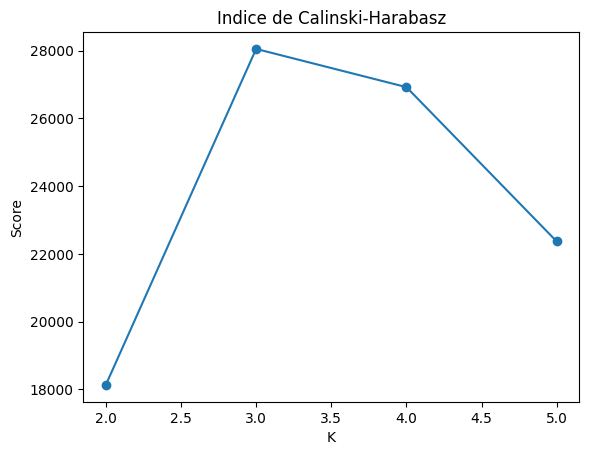

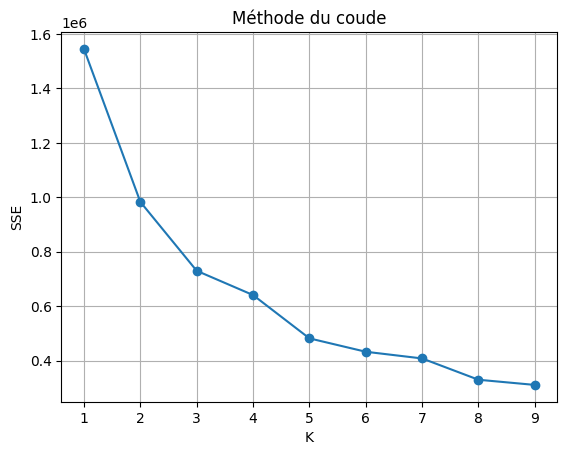

In [3]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import calinski_harabasz_score

def plot_calinski_harabasz(data):
    scores = []
    for k in range(2, 6):
        labels = KMeans(n_clusters=k).fit_predict(data[:50000])
        score = calinski_harabasz_score(data[:50000], labels)
        scores.append(score)
        print(f"K={k}, Calinski-Harabasz={score:.2f}")
    plt.plot(range(2, 6), scores, marker='o')
    plt.title("Indice de Calinski-Harabasz")
    plt.xlabel("K")
    plt.ylabel("Score")
    plt.show()

def plot_elbow_method(data):
    sse = []
    for k in range(1, 10):
        kmeans = KMeans(n_clusters=k)
        kmeans.fit(data)
        sse.append(kmeans.inertia_)
    plt.plot(range(1, 10), sse, marker='o')
    plt.title("Méthode du coude")
    plt.xlabel("K")
    plt.ylabel("SSE")
    plt.grid(True)
    plt.show()

plot_calinski_harabasz(data_scaled)
plot_elbow_method(data_scaled)


3. Clustering KMeans + évaluation

In [4]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

kmeans = KMeans(n_clusters=3, random_state=42)
labels_kmeans = kmeans.fit_predict(data_scaled)
data_navigation['Cluster'] = labels_kmeans

print("KMeans:")
print(f"Silhouette: {silhouette_score(data_scaled[:50000], labels_kmeans[:50000]):.3f}")
print(f"Calinski-Harabasz: {calinski_harabasz_score(data_scaled[:50000], labels_kmeans[:50000]):.2f}")
print(f"Davies-Bouldin: {davies_bouldin_score(data_scaled[:50000], labels_kmeans[:50000]):.3f}")


/tmp/ipykernel_18988/2552026221.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_navigation['Cluster'] = labels_kmeans


KMeans:
Silhouette: 0.298
Calinski-Harabasz: 23210.61
Davies-Bouldin: 1.299


4. Clustering avec DBSCAN

In [5]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.5, min_samples=10)
labels_dbscan = dbscan.fit_predict(data_scaled[:50000])

print("\nDBSCAN:")
print(f"Silhouette: {silhouette_score(data_scaled[:50000], labels_dbscan[:50000]):.3f}")
print(f"Calinski-Harabasz: {calinski_harabasz_score(data_scaled[:50000], labels_dbscan[:50000]):.2f}")
print(f"Davies-Bouldin: {davies_bouldin_score(data_scaled[:50000], labels_dbscan[:50000]):.3f}")
print(f"Clusters: {len(set(labels_dbscan)) - (1 if -1 in labels_dbscan else 0)}")
print(f"Bruit: {list(labels_dbscan).count(-1)}")



DBSCAN:
Silhouette: 0.237
Calinski-Harabasz: 3337.64
Davies-Bouldin: 1.110
Clusters: 7
Bruit: 5


5. Clustering hiérarchique agglomératif

In [6]:
from sklearn.cluster import AgglomerativeClustering

hclust = AgglomerativeClustering(n_clusters=3)
labels_hclust = hclust.fit_predict(data_scaled[:25000])

print("\nHierarchical Clustering:")
print(f"Silhouette: {silhouette_score(data_scaled[:25000], labels_hclust):.3f}")
print(f"Calinski-Harabasz: {calinski_harabasz_score(data_scaled[:25000], labels_hclust):.2f}")
print(f"Davies-Bouldin: {davies_bouldin_score(data_scaled[:25000], labels_hclust):.3f}")



Hierarchical Clustering:
Silhouette: 0.351
Calinski-Harabasz: 12819.13
Davies-Bouldin: 1.116


6. Visualisation sur carte interactive

In [7]:
import plotly.express as px

data_navigation['Cluster'] = labels_kmeans.astype(str)

fig = px.scatter_mapbox(
    data_navigation,
    lat="LAT",
    lon="LON",
    color="Cluster",
    hover_data=["SOG", "COG"],
    zoom=4,
    height=800,
    mapbox_style="open-street-map",
    title="Clusters de navires par K-Means (K=3)",
    color_discrete_sequence=px.colors.qualitative.Set1
)

fig.update_layout(
    mapbox=dict(center=dict(
        lat=data_navigation["LAT"].mean(),
        lon=data_navigation["LON"].mean()
    )),
    margin={"r":0,"t":40,"l":0,"b":0}
)

fig.show()


/tmp/ipykernel_18988/3695836499.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_navigation['Cluster'] = labels_kmeans.astype(str)
/tmp/ipykernel_18988/3695836499.py:5: DeprecationWarning: *scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/
  fig = px.scatter_mapbox(


7. Prédiction de cluster (script)

In [8]:
import joblib

# Entraîne ton modèle et scaler comme tu l’as déjà fait
kmeans = KMeans(n_clusters=3, random_state=42).fit(data_scaled)
scaler = StandardScaler().fit(data_imputed)

# Sauvegarde des objets
joblib.dump(kmeans, 'kmeans_model.pkl')
joblib.dump(scaler, 'scaler.pkl')
print("Modèle et scaler sauvegardés !")


Modèle et scaler sauvegardés !


In [9]:
import joblib
import numpy as np

def main():
    # Chargement des objets sauvegardés
    try:
        kmeans = joblib.load('kmeans_model.pkl')
        scaler = joblib.load('scaler.pkl')
    except FileNotFoundError:
        print(" Modèle ou scaler introuvable. Vérifie les noms de fichiers.")
        return

    # Saisie utilisateur
    print("Saisis les caractéristiques du navire :")
    try:
        lat = float(input("Latitude : "))
        lon = float(input("Longitude : "))
        sog = float(input("Speed Over Ground (SOG) : "))
        cog = float(input("Course Over Ground (COG) : "))
    except ValueError:
        print(" Entrée invalide. Veuillez entrer des nombres.")
        return

    # Prédiction
    features = np.array([[lat, lon, sog, cog]])
    features_scaled = scaler.transform(features)
    cluster = kmeans.predict(features_scaled)

    print(f"\n Le navire appartient au cluster : {cluster[0]}")

if __name__ == "__main__":
    main()


Saisis les caractéristiques du navire :

 Le navire appartient au cluster : 0
